# Load modules

In [1]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import pandas as pd
import scvelo as scv

# Preset some parameters

In [2]:

scv.logging.print_version()
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization


Running scvelo 0.2.4 (python 3.8.5) on 2021-11-24 00:40.


# Run scvelo

## Load in data

In [ ]:
#read in h5 data
hnscc_velo = scv.read("hnscc.velo.v2.h5ad")
hnscc_velo


## check unspliced proportion

In [ ]:
hnscc_velo.obs['Major_Type_anno'] = hnscc_velo.obs['Major_Type_anno'].astype('category')
scv.pl.proportions(hnscc_velo, groupby='Major_Type_anno', save='hnscc_splice_unsplice_prop.pdf')


## Preprocessing

In [ ]:
#Preprocess the Data
scv.pp.filter_and_normalize(hnscc_velo, min_shared_counts=20, n_top_genes=5000)
scv.pp.moments(hnscc_velo, n_pcs=50, n_neighbors=50)


## Estimate RNA velocity

In [ ]:
#Estimate RNA velocity with dynamical model
scv.tl.recover_dynamics(hnscc_velo)
scv.tl.velocity(hnscc_velo, mode='dynamical')
scv.tl.velocity_graph(hnscc_velo)


In [ ]:
major_anno_cols = ["#008000", "#68ffa9", "#8000f1", "#ff1fc3", 
                   "#c2ff82", "#80c600", "#e86c00", "#ff87ab", 
                   "#1b98e0", "#cae9ff", "#ffd53a", "#08fffe", "#e32b00"]
scv.pl.velocity_embedding_stream(hnscc_velo, basis="tsne", 
                                 color="Major_Type_anno", 
                                 palette=major_anno_cols, 
                                 title = "", 
                                 save="hnscc_velo_embed_stream.pdf")

In [ ]:
scv.pl.velocity_embedding(hnscc_velo, basis="tsne", 
                          color="Major_Type_anno", 
                          palette=major_anno_cols, 
                          title = "", 
                          #dpi = 300, 
                          save="hnscc_velo_embed.pdf")

In [ ]:
scv.pl.velocity_embedding_grid(hnscc_velo, basis="tsne", 
                               color="Major_Type_anno",
                               palette=major_anno_cols,
                               title = "", 
                               #dpi = 300,
                               save="hnscc_velo_embed_grid.pdf")

In [ ]:
# plot velocity of a selected gene
scv.pl.velocity(hnscc_velo, 
                basis='tsne',
                var_names=['LYZ', 'ISG15', 'NLRP3', 'INHBA', 'SPP1', 'C1QC'], 
                color='Major_Type_anno',
                save="hnscc_velo_mp_markers.pdf")

In [ ]:
#Identify important genes
scv.tl.rank_velocity_genes(hnscc_velo, groupby='Major_Type_anno', min_corr=.3)

df = scv.DataFrame(hnscc_velo.uns['rank_velocity_genes']['names'])
df.head()
df.to_csv("hnscc_rank_velocity_genes.csv")


In [ ]:
# plot velocity of a selected gene from velocity markers
scv.pl.velocity(hnscc_velo, 
                basis='tsne',
                var_names=['SLC11A1', 'FTL', 'ASAH1', 'KMT2E', 'MGST2'], 
                color='Major_Type_anno',
                save="hnscc_velo_mp_velocity_markers.pdf")

In [ ]:
kwargs = dict(frameon=False, size=10, linewidth=1.5,
              add_outline='MoMacDC')

scv.pl.scatter(hnscc_velo, df['MoMacDC'][:3], ylabel='MoMacDC', frameon=False, color='Major_Type_anno', size=10, linewidth=1.5)


* Speed: length of the velocity vector
* Coherence: how well a velocity vector correlates to its neighbors

In [ ]:
#Speed and coherence
scv.tl.velocity_confidence(hnscc_velo)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(hnscc_velo, basis="tsne", c=keys, cmap='coolwarm', perc=[5, 95], save = "hnscc_velo_confidence.pdf")


In [ ]:
df_speed = hnscc_velo.obs.groupby('Major_Type_anno')[keys].mean().T
df_speed.style.background_gradient(cmap='coolwarm', axis=1)
#df_speed.to_csv("hnscc_velo_speed_coherence.csv")


In [ ]:
#PAGA velocity graph
scv.tl.velocity_pseudotime(hnscc_velo)
scv.pl.scatter(hnscc_velo, basis='tsne', color='velocity_pseudotime', cmap='gnuplot', save="hnscc_velo_pseudotime.pdf")

# this is needed due to a current bug - bugfix is coming soon.
hnscc_velo.uns['neighbors']['distances'] = hnscc_velo.obsp['distances']
hnscc_velo.uns['neighbors']['connectivities'] = hnscc_velo.obsp['connectivities']
scv.tl.paga(hnscc_velo, groups='Major_Type_anno')
paga_df = scv.get_df(hnscc_velo, 'paga/transitions_confidence', precision=2).T
paga_df.style.background_gradient(cmap='Blues').format('{:.2g}')
paga_df.to_csv("hnscc_velo_paga.csv")

scv.pl.paga(hnscc_velo, basis='tsne', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, save='hnscc_velo_paga.pdf')

In [ ]:
#Latent time
scv.tl.latent_time(hnscc_velo)
scv.pl.scatter(hnscc_velo, basis='tsne', color='latent_time', color_map='gnuplot', size=80)


In [ ]:
top_genes = hnscc_velo.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(hnscc_velo, var_names=top_genes, sortby='latent_time', col_color='Major_Type_anno', n_convolve=100)

In [ ]:
#Top-likelihood genes
top_genes_all = hnscc_velo.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(hnscc_velo, basis=top_genes_all[:15], ncols=5, color='Major_Type_anno', frameon=False)


In [ ]:
var_names = ['PTPRC', 'RPS27', 'CD52', 'ANXA2', 'CLEC12A']
scv.pl.scatter(hnscc_velo, var_names, frameon=False)
#scv.pl.scatter(hnscc_velo, x='latent_time', y=var_names, frameon=False)

In [ ]:
#Cluster-specific top-likelihood genes
scv.tl.rank_dynamical_genes(hnscc_velo, groupby='Major_Type_anno')
cluster_lh_df = scv.get_df(hnscc_velo, 'rank_dynamical_genes/names')
cluster_lh_df.head(5)
#cluster_lh_df.to_csv("hnscc_velo_rank_dynamical_genes.csv")


In [ ]:
for cluster in ['MoMacDC', 'Neutrophils', 'Mast cells', 'Fibroblasts']:
    scv.pl.scatter(hnscc_velo, df[cluster][:5], ylabel=cluster, color='Major_Type_anno', frameon=False)


# Analyzing MoMacDC cluster

In [3]:
#read in h5 data
myeloids_velo = scv.read("hnscc_tumor_myeloids_velo.h5ad")
myeloids_velo

AnnData object with n_obs × n_vars = 3246 × 24344
    obs: 'orig_ident', 'nCount_RNA', 'nFeature_RNA', 'percent_mt', 'patient', 'tissue', 'treatment', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'predicted_id', 'prediction_score_max', 'major_predicted_id', 'major_prediction_score_max', 'first_labels', 'labels', 'pruned_labels', 'reference', 'ImmuneOrNot', 'Major_Type_anno', 'hnscc_group_gs_prediction', 'CellID', 'nCount_spliced', 'nFeature_spliced', 'nCount_unspliced', 'nFeature_unspliced', 'nCount_ambiguous', 'nFeature_ambiguous'
    var: 'features', 'ambiguous_features', 'spliced_features', 'unspliced_features'
    obsm: 'X_mca', 'X_tsne', 'X_umap'
    varm: 'MCA'
    layers: 'ambiguous', 'spliced', 'unspliced'

## check unspliced proportion

saving figure to file ./figures/scvelo_proportions_tumor_myeloids_splice_unsplice_prop.pdf


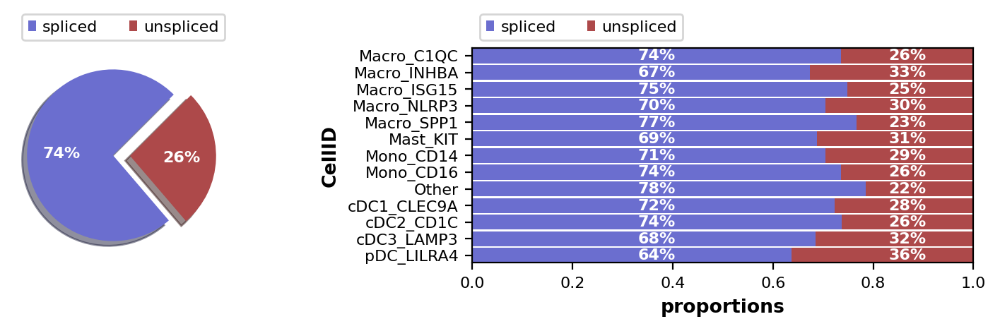

In [6]:
myeloids_velo.obs['CellID'] = myeloids_velo.obs['CellID'].astype('category')
scv.pl.proportions(myeloids_velo, groupby='CellID', save='tumor_myeloids_splice_unsplice_prop.pdf')


## Preprocessing

In [5]:
#Preprocess the Data
scv.pp.filter_and_normalize(myeloids_velo, min_shared_counts=10, n_top_genes=2000)
scv.pp.moments(myeloids_velo, n_pcs=50, n_neighbors=50)


Filtered out 16911 genes that are detected 10 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 5029 highly variable genes.
computing neighbors
    finished (0:00:37) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


## Estimate RNA velocity

In [7]:
#Estimate RNA velocity with dynamical model
scv.tl.recover_dynamics(myeloids_velo)
scv.tl.velocity(myeloids_velo, mode='dynamical')
scv.tl.velocity_graph(myeloids_velo)


recovering dynamics (using 1/72 cores)



    finished (0:16:19) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:08) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/72 cores)



    finished (0:00:19) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_tsne', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_tumor_myeloids_velo_embed_stream.svg


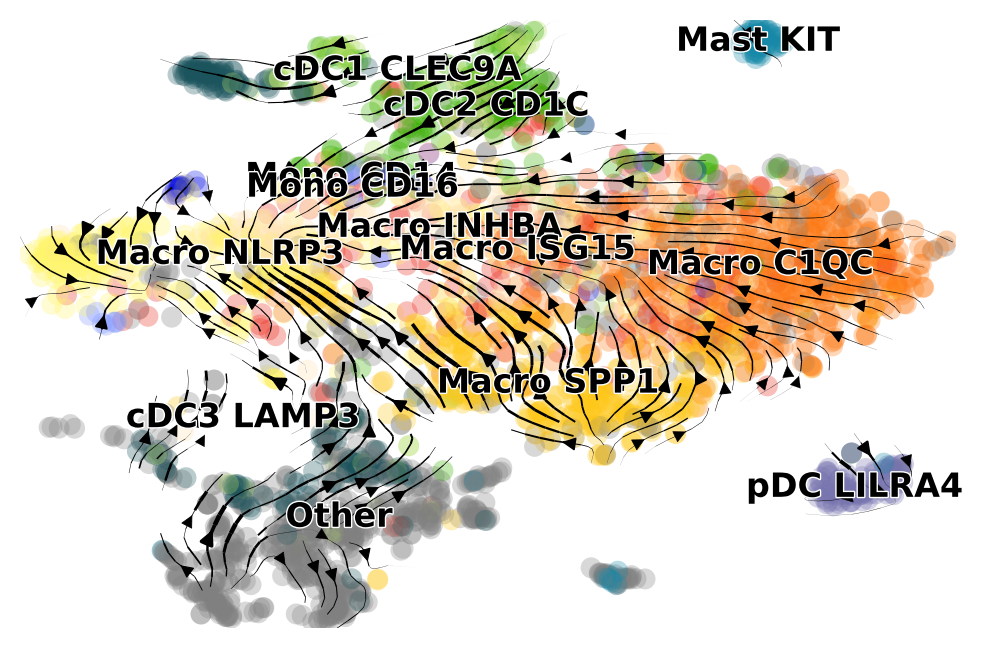

In [8]:
ggcolor1 = {"Mast_KIT" : "#1688A7", "pDC_LILRA4" : "#7673AE", "cDC1_CLEC9A" : "#b3de69", 
            "cDC2_CD1C" : "#38b000", "cDC3_LAMP3" : "#1a535c", "Macro_C1QC" : "#FD7915", 
            "Macro_INHBA" : "#FFE4B5", "Macro_ISG15" : "#EB2C1D", "Macro_NLRP3" : "#FFF56A", 
            "Macro_SPP1" : "#FEC718", "Mono_CD14" : "#8197FF", "Mono_CD16" : "#0911E9", 
            "Mono_CD14CD16" : "#1FDBFE", "Other" : "gray"}
  
scv.pl.velocity_embedding_stream(myeloids_velo, basis="tsne", 
                                 color="CellID", 
                                 palette=ggcolor1, 
                                 title = "", 
                                 #dpi = 300,
                                 save="tumor_myeloids_velo_embed_stream.svg")

saving figure to file ./figures/scvelo_tumor_myeloids_velo_embed.pdf


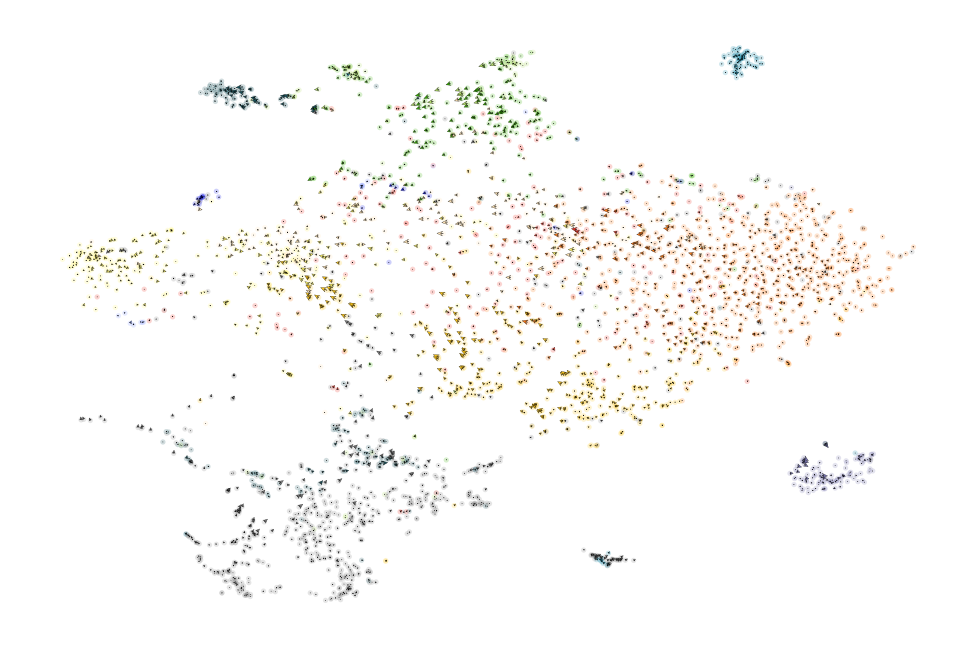

In [9]:
scv.pl.velocity_embedding(myeloids_velo, basis="tsne", 
                          color="CellID", 
                          palette=ggcolor1, 
                          title = "", 
                          #dpi = 300, 
                          save="tumor_myeloids_velo_embed.pdf")

saving figure to file ./figures/scvelo_tumor_myeloids_velo_embed_grid.pdf


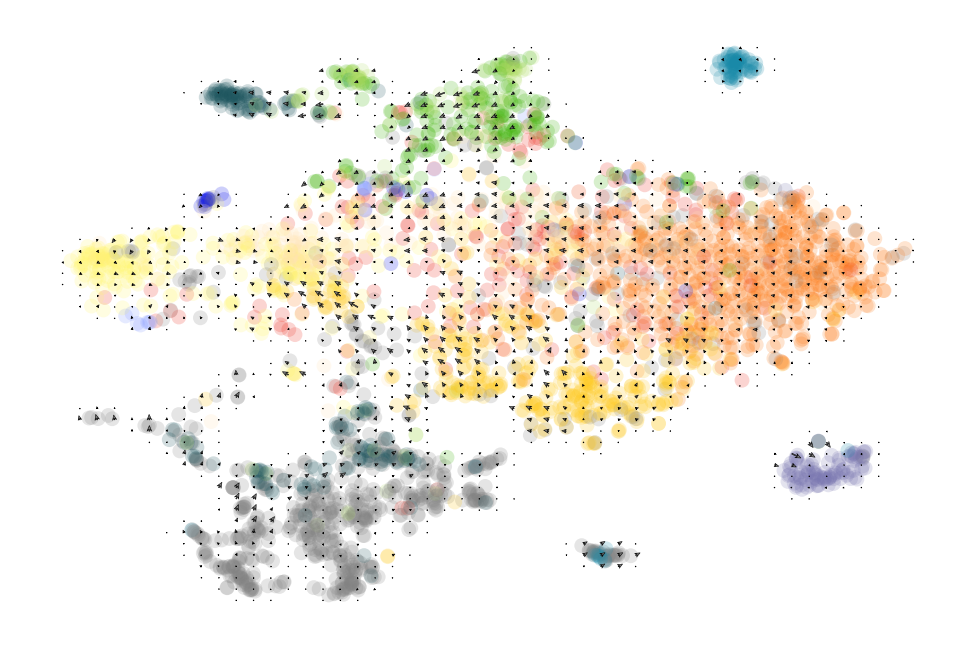

In [10]:
scv.pl.velocity_embedding_grid(myeloids_velo, basis="tsne", 
                               color="CellID",
                               palette=ggcolor1,
                               title = "", 
                               #dpi = 300,
                               save="tumor_myeloids_velo_embed_grid.pdf")

saving figure to file ./figures/scvelo_tumor_myeloids_velo_mp_markers.pdf


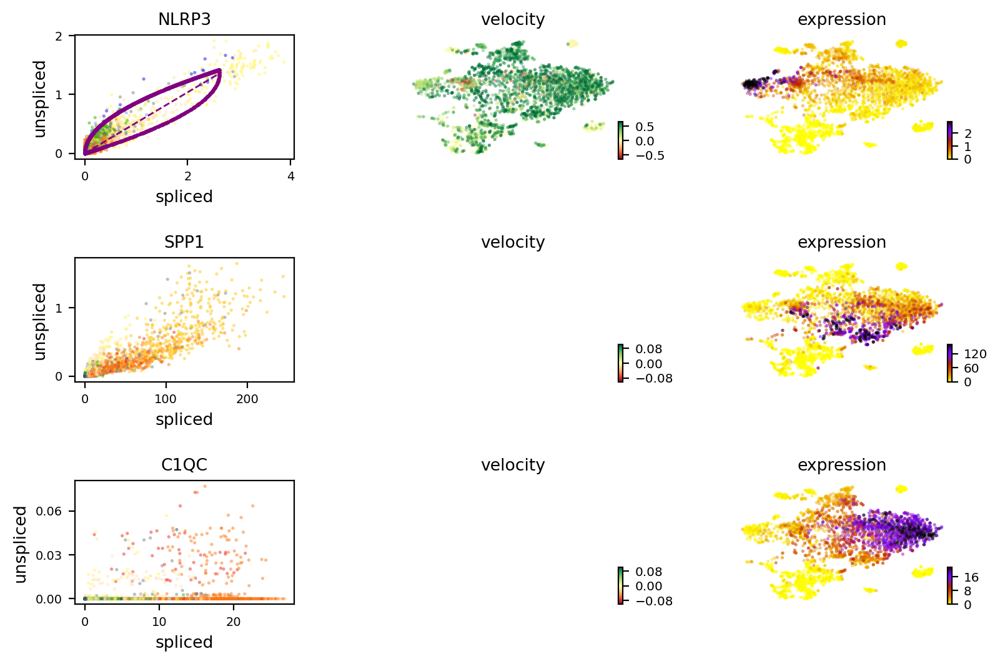

In [11]:
# plot velocity of a selected gene
scv.pl.velocity(myeloids_velo, 
                basis='tsne',
                var_names=['LYZ', 'ISG15', 'NLRP3', 'INHBA', 'SPP1', 'C1QC'], 
                color='CellID',
                save="tumor_myeloids_velo_mp_markers.pdf")

In [12]:
#Identify important genes
scv.tl.rank_velocity_genes(myeloids_velo, groupby='CellID', min_corr=.3)

df = scv.DataFrame(myeloids_velo.uns['rank_velocity_genes']['names'])
df.head()
df.to_csv("tumor_myeloids_velo_rank_velocity_genes.csv")


ranking velocity genes
    finished (0:00:04) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


saving figure to file ./figures/scvelo_tumor_myeloids_velo_mp_velocity_markers.pdf


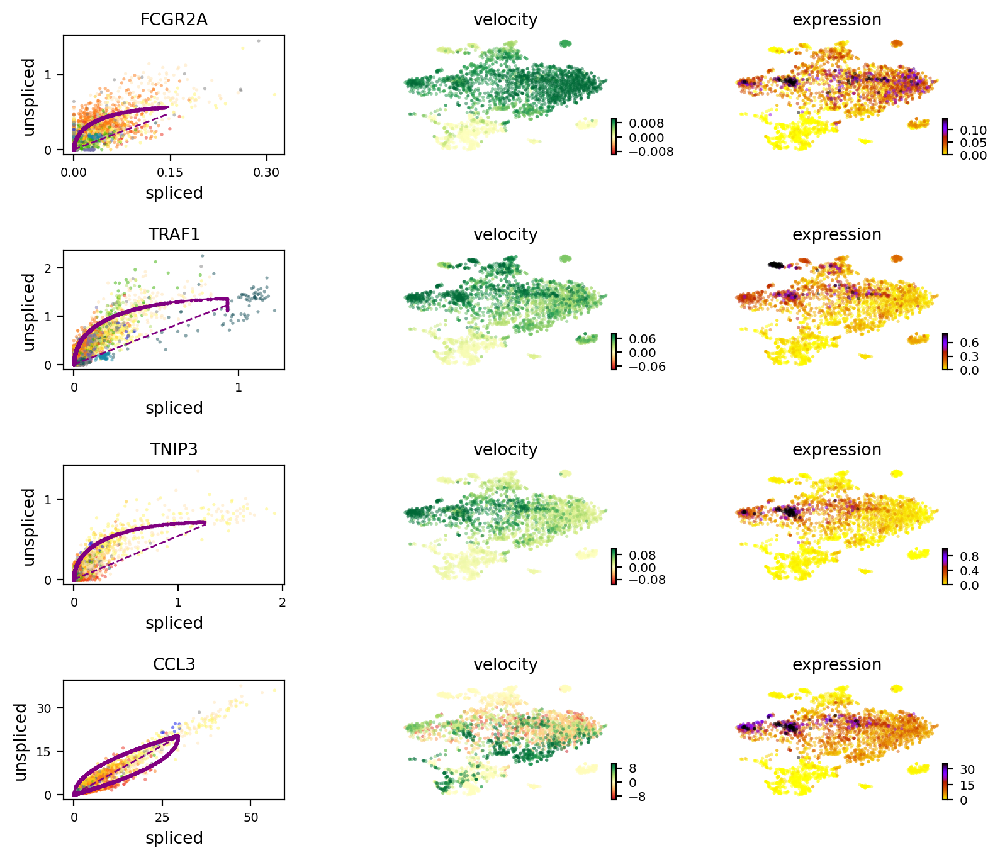

In [13]:
# plot velocity of a selected gene from velocity markers
scv.pl.velocity(myeloids_velo, 
                basis='tsne',
                var_names=['FCGR2A', 'TRAF1', 'GLUD1', 'TNIP3', 'CCL3'],
                color='CellID',
                save="tumor_myeloids_velo_mp_velocity_markers.pdf")

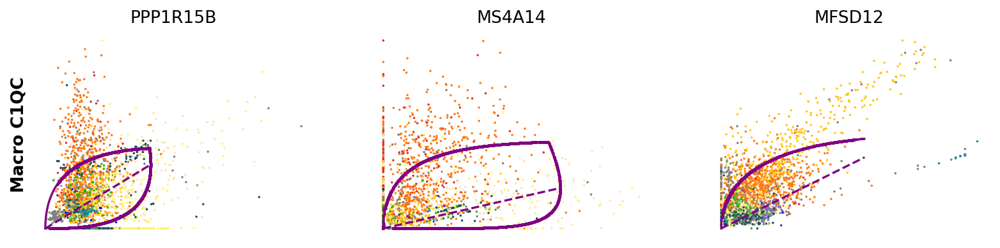

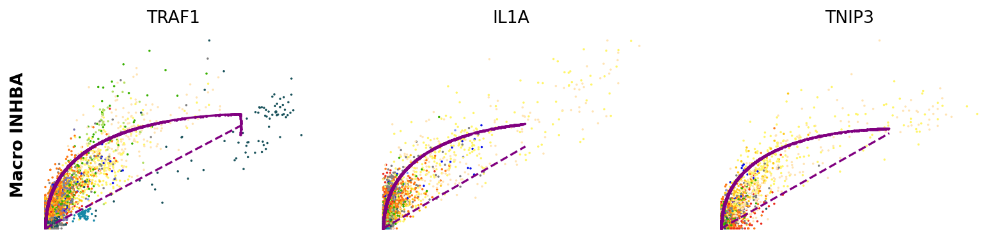

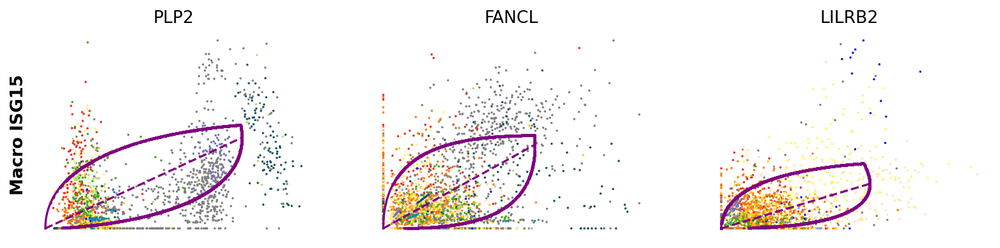

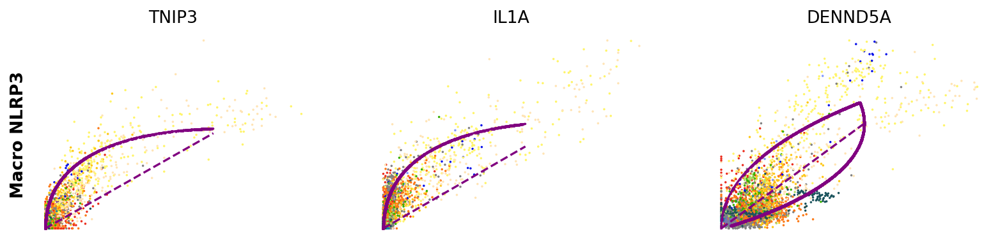

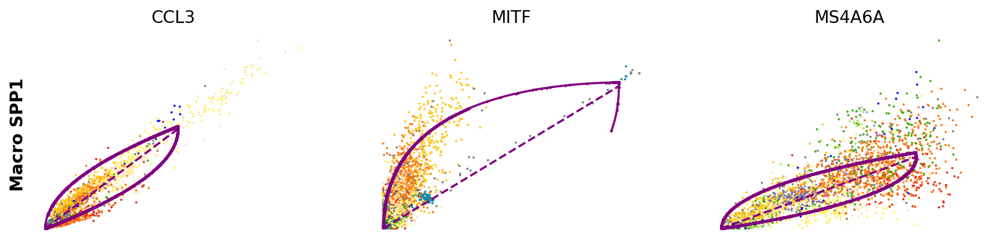

In [14]:
kwargs = dict(frameon=False, size=10, linewidth=1.5,
              add_outline='Macro_C1QC, Macro_INHBA, Macro_ISG15, Macro_NLRP3, Macro_SPP1')

scv.pl.scatter(myeloids_velo, df['Macro_C1QC'][:3], ylabel='Macro_C1QC', frameon=False, color='CellID', size=10, linewidth=1.5)
scv.pl.scatter(myeloids_velo, df['Macro_INHBA'][:3], ylabel='Macro_INHBA', frameon=False, color='CellID', size=10, linewidth=1.5)
scv.pl.scatter(myeloids_velo, df['Macro_ISG15'][:3], ylabel='Macro_ISG15', frameon=False, color='CellID', size=10, linewidth=1.5)
scv.pl.scatter(myeloids_velo, df['Macro_NLRP3'][:3], ylabel='Macro_NLRP3', frameon=False, color='CellID', size=10, linewidth=1.5)
scv.pl.scatter(myeloids_velo, df['Macro_SPP1'][:3], ylabel='Macro_SPP1', frameon=False, color='CellID', size=10, linewidth=1.5)


--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)
saving figure to file ./figures/scvelo_tumor_myeloids_velo_confidence.pdf


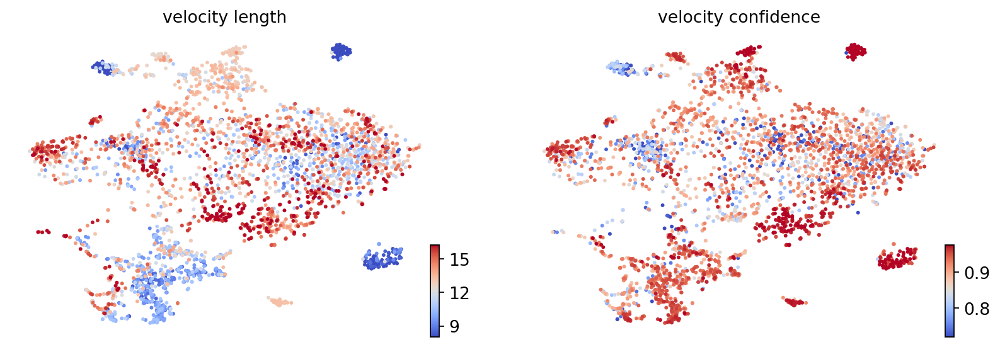

In [15]:
#Speed and coherence
scv.tl.velocity_confidence(myeloids_velo)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(myeloids_velo, basis="tsne", c=keys, cmap='coolwarm', perc=[5, 95], save = "tumor_myeloids_velo_confidence.pdf")

In [16]:
myeloid_df_speed = myeloids_velo.obs.groupby('CellID')[keys].mean().T
myeloid_df_speed.style.background_gradient(cmap='coolwarm', axis=1)
myeloid_df_speed.to_csv("tumor_myeloid_velo_speed_coherence.csv")


computing terminal states
    identified 3 regions of root cells and 1 region of end points .
    finished (0:00:05) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
saving figure to file ./figures/scvelo_tumor_myeloids_velo_pseudotime.pdf


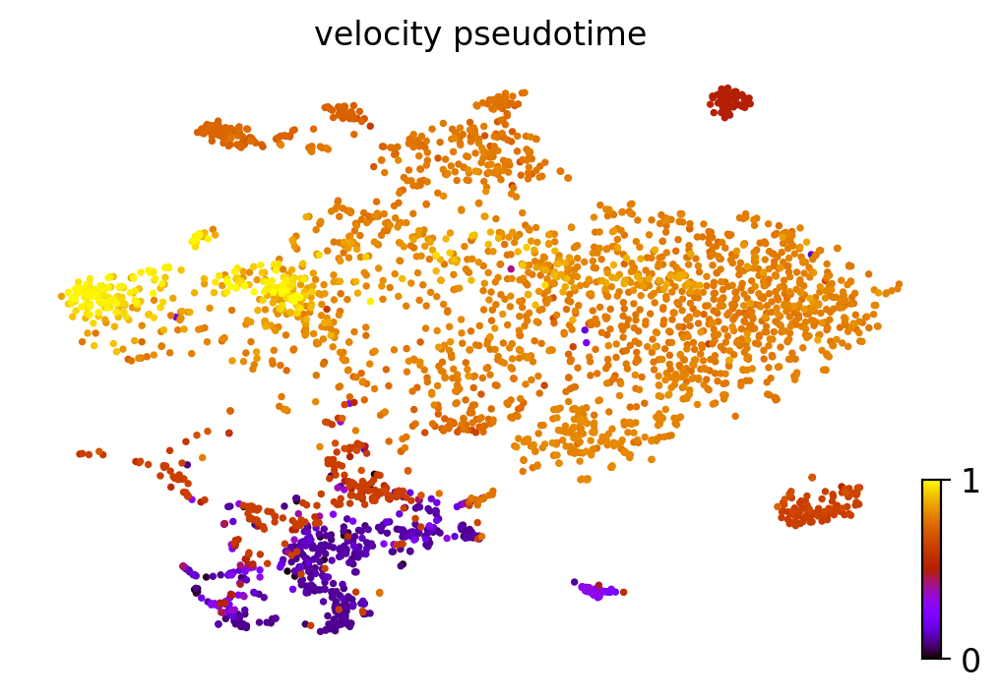

In [17]:
scv.tl.velocity_pseudotime(myeloids_velo)
scv.pl.scatter(myeloids_velo, basis='tsne', color='velocity_pseudotime', cmap='gnuplot', save="tumor_myeloids_velo_pseudotime.pdf")


running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo_tumor_myeloid_velo_paga.pdf


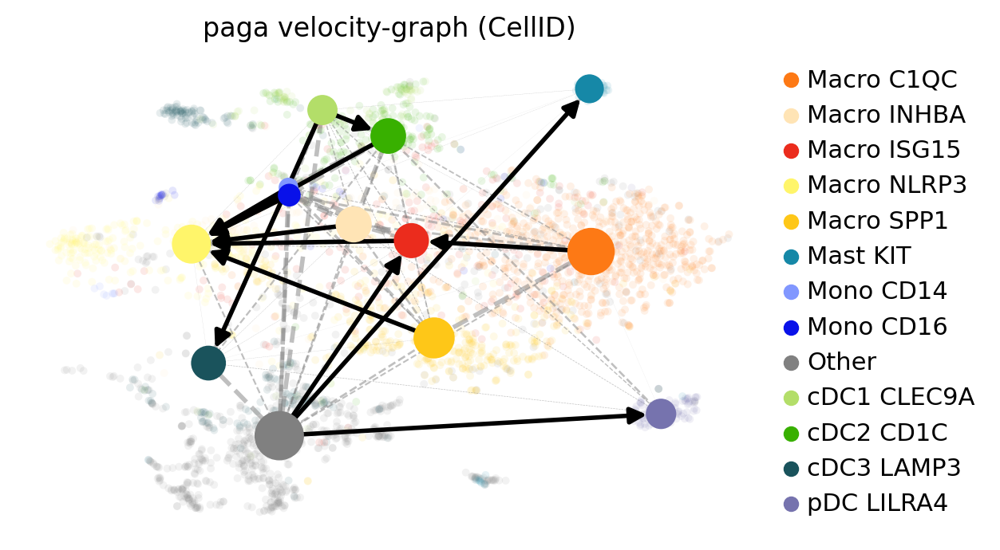

In [18]:
#PAGA velocity graph

# this is needed due to a current bug - bugfix is coming soon.
myeloids_velo.uns['neighbors']['distances'] = myeloids_velo.obsp['distances']
myeloids_velo.uns['neighbors']['connectivities'] = myeloids_velo.obsp['connectivities']

scv.tl.paga(myeloids_velo, groups='CellID')
myeloid_paga_df = scv.get_df(myeloids_velo, 'paga/transitions_confidence', precision=2).T
myeloid_paga_df.style.background_gradient(cmap='Blues').format('{:.2g}')
myeloid_paga_df.to_csv("tumor_myeloid_velo_paga.csv")

scv.pl.paga(myeloids_velo, basis='tsne', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, save='tumor_myeloid_velo_paga.pdf')

saving figure to file ./figures/scvelo_tumor_myeloid_velo_paga_v3.svg


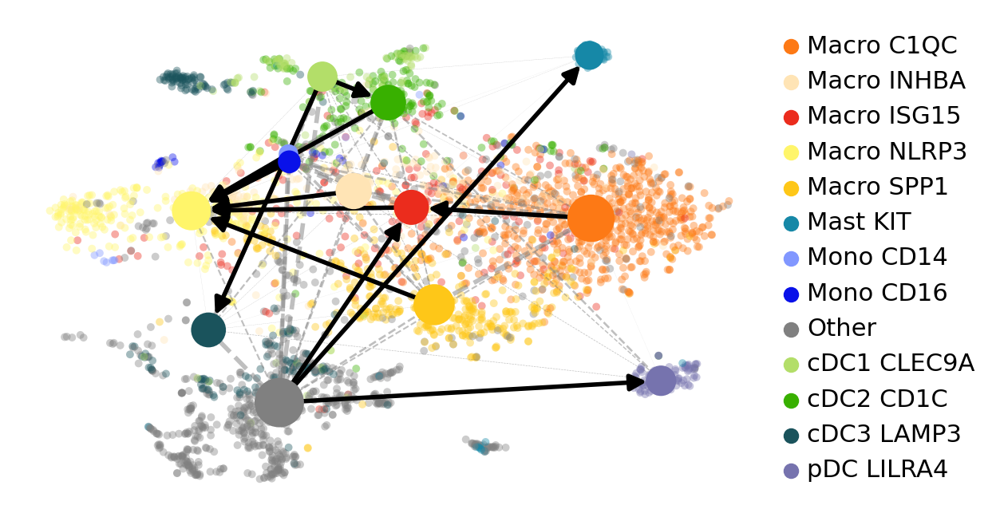

In [19]:
scv.pl.paga(myeloids_velo, basis='tsne', size=50, alpha=.4, title='', format='svg',
            min_edge_width=2, node_size_scale=1.5, save='tumor_myeloid_velo_paga_v3.svg')

computing latent time using root_cells as prior
    finished (0:00:02) --> added 
    'latent_time', shared time (adata.obs)


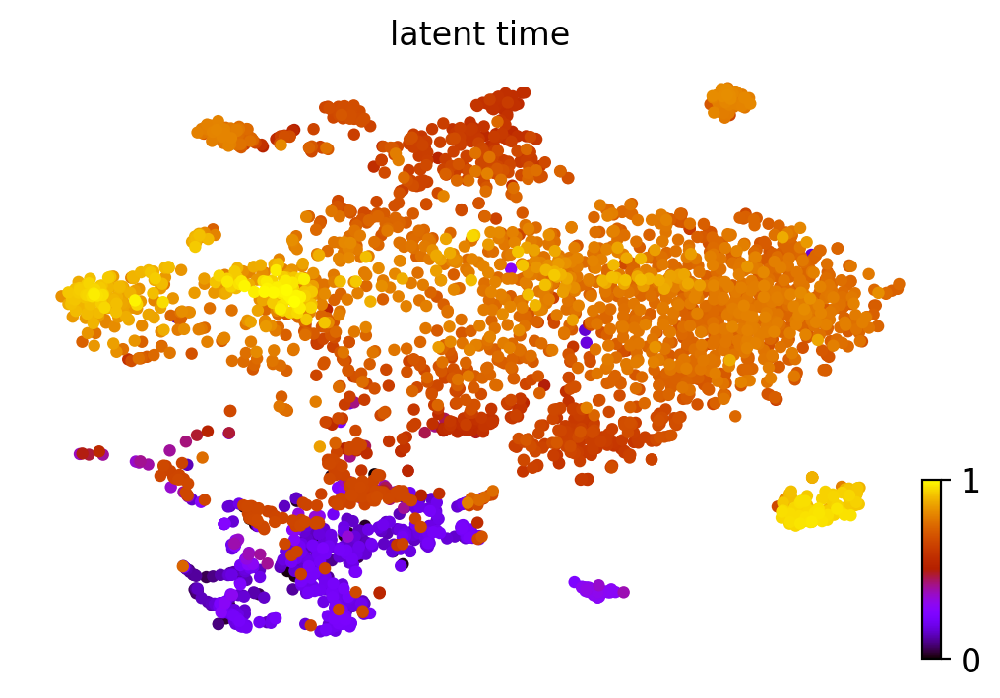

In [20]:
#Latent time
scv.tl.latent_time(myeloids_velo)
scv.pl.scatter(myeloids_velo, basis='tsne', color='latent_time', color_map='gnuplot', size=80)


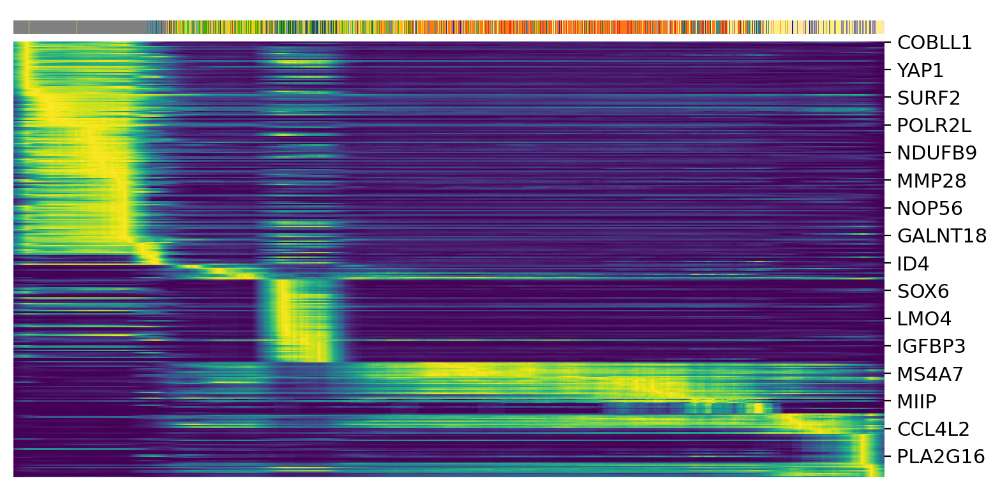

In [21]:
myeloid_top_genes = myeloids_velo.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(myeloids_velo, var_names=myeloid_top_genes, sortby='latent_time', col_color='CellID', n_convolve=100)

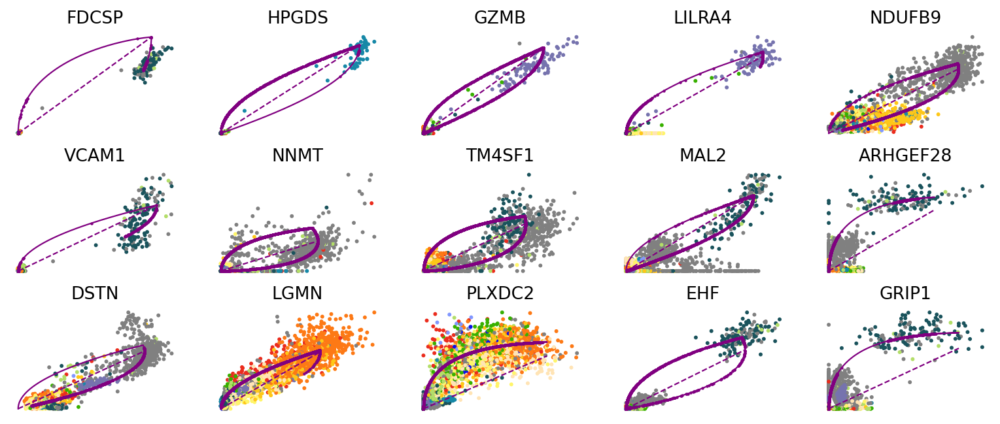

In [22]:
#Top-likelihood genes
myeloid_top_genes_all = myeloids_velo.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(myeloids_velo, basis=myeloid_top_genes_all[:15], ncols=5, color='CellID', frameon=False)


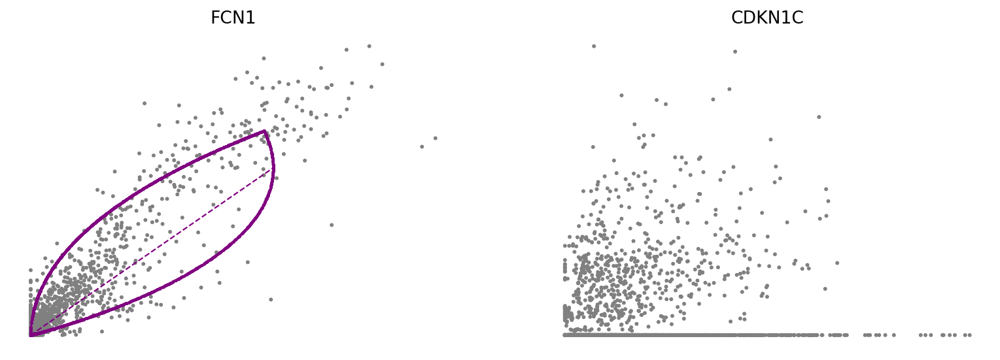

In [23]:
var_names = ['WDR66', 'FCN1', 'CDKN1C', 'LST1']
scv.pl.scatter(myeloids_velo, var_names, frameon=False)
#scv.pl.scatter(myeloids_velo, x='latent_time', y=var_names, frameon=False)

In [27]:
#Cluster-specific top-likelihood genes
scv.tl.rank_dynamical_genes(myeloids_velo, groupby='CellID')
myeloid_cluster_lh_df = scv.get_df(myeloids_velo, 'rank_dynamical_genes/names')
myeloid_cluster_lh_df.head(5)
myeloid_cluster_lh_df.to_csv("tumor_myeloids_velo_rank_dynamical_genes.csv")


ranking genes by cluster-specific likelihoods
    finished (0:00:05) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_Macro_C1QC.pdf


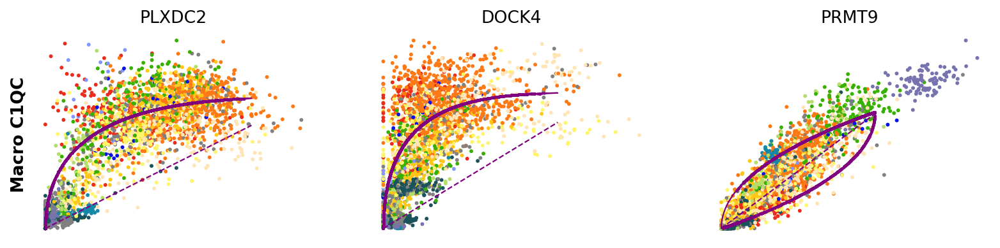

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_Macro_INHBA.pdf


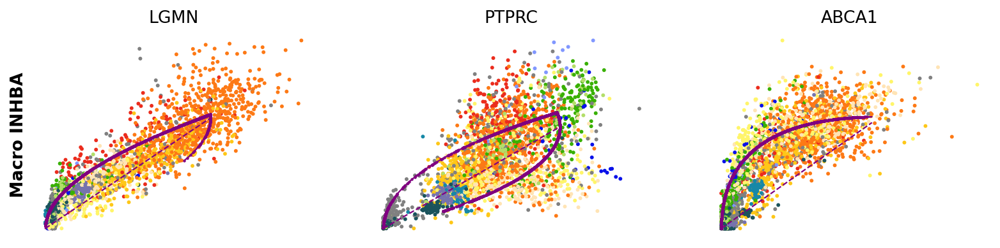

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_Macro_ISG15.pdf


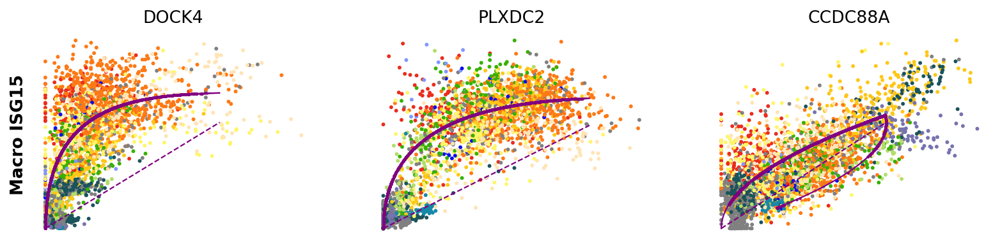

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_Macro_NLRP3.pdf


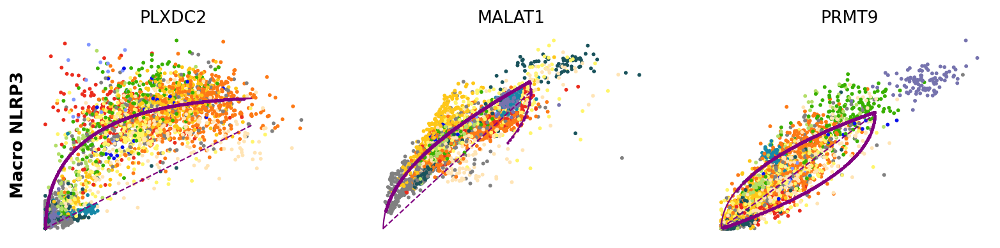

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_Macro_SPP1.pdf


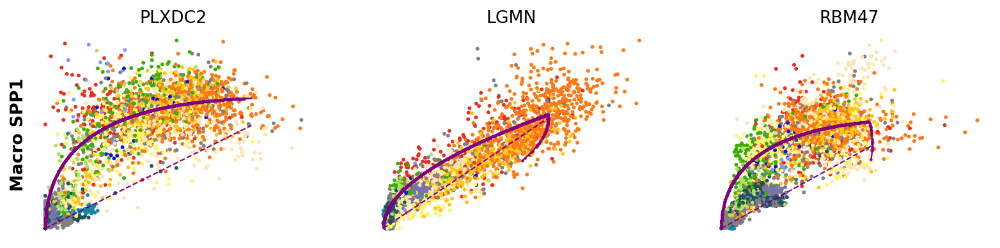

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_Mast_KIT.pdf


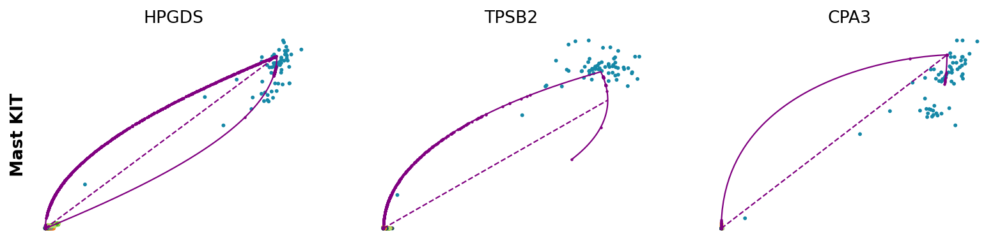

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_Mono_CD14.pdf


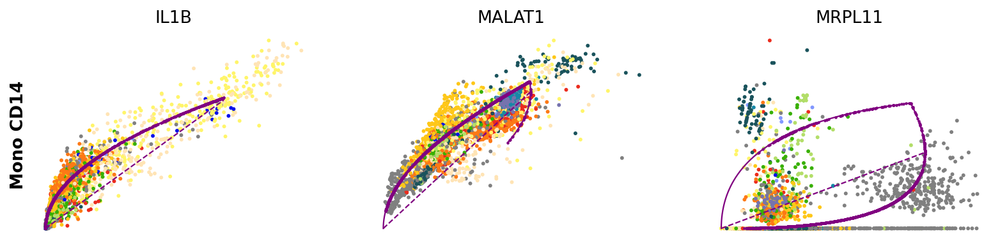

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_Mono_CD16.pdf


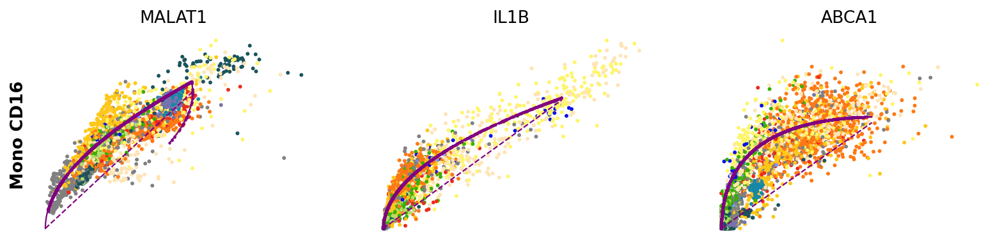

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_Other.pdf


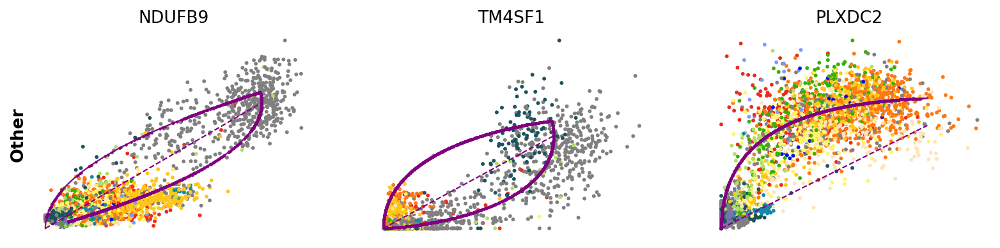

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_cDC1_CLEC9A.pdf


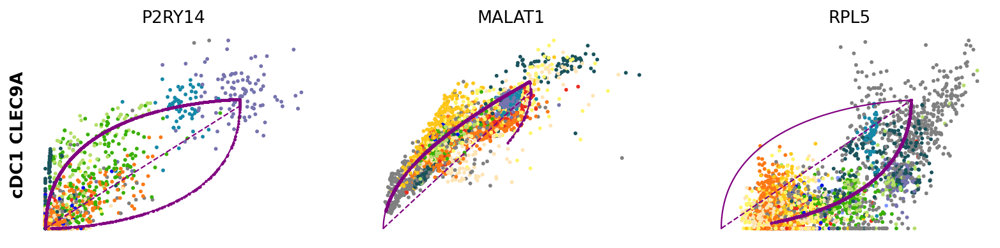

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_cDC2_CD1C.pdf


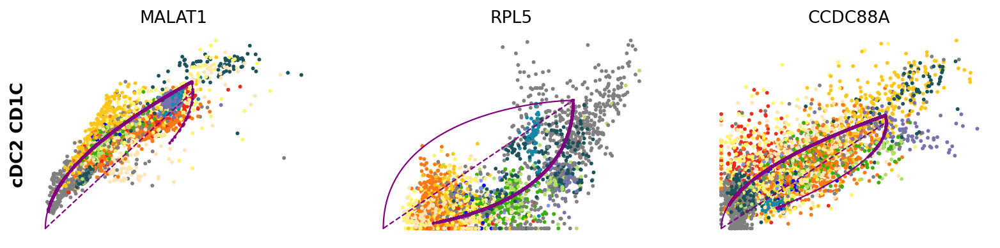

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_cDC3_LAMP3.pdf


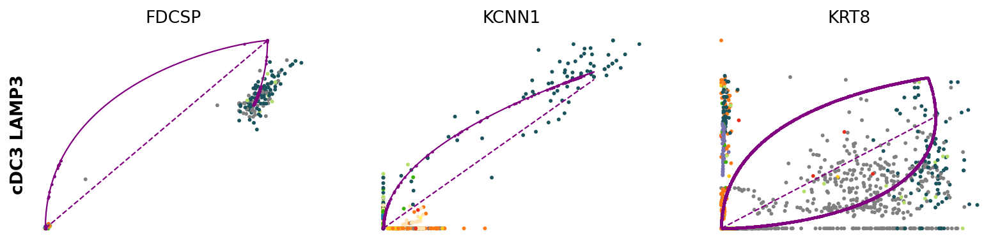

saving figure to file ./figures/scvelo_scvelo_tumor_myeloid_velo_top_likelihood_3genes_pDC_LILRA4.pdf


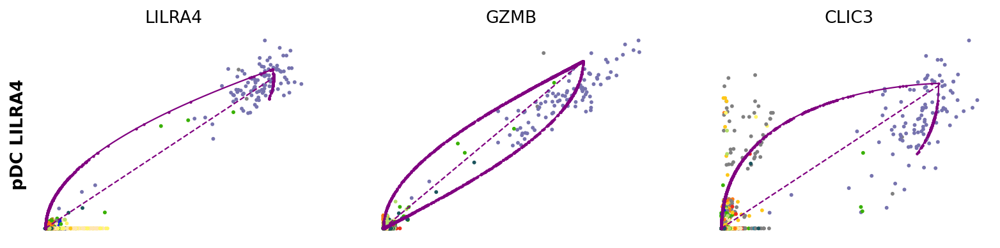

In [25]:
for cluster in list(myeloid_cluster_lh_df.columns):
    file = ("scvelo_tumor_myeloid_velo_top_likelihood_3genes_" + cluster + ".pdf")
    scv.pl.scatter(myeloids_velo, myeloid_cluster_lh_df[cluster][:3], 
                   ylabel=cluster, color='CellID', frameon=False,
                   save=file)
#fig.savefig("myeloid_velo_top_likelihood_genes.pdf")

